<a href="https://colab.research.google.com/github/dctime/minecraft-texture-generation/blob/main/sword_diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torchvision
import matplotlib.pyplot as plt
import torchvision.datasets as dset
import shutil
import os
import numpy
from PIL import Image
from torchvision import datasets
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import numpy as np



In [2]:
shutil.unpack_archive("drive/MyDrive/Minecraft Sword Generator/minecraft_textures.zip", "")

In [3]:

def custom_loader(path):
    with open(path, 'rb') as f:
        img = Image.open(f)
        return img.convert('RGBA')

dataset = datasets.ImageFolder(root="minecraft_textures", loader=custom_loader)

Dataset ImageFolder
    Number of datapoints: 2000
    Root location: minecraft_textures


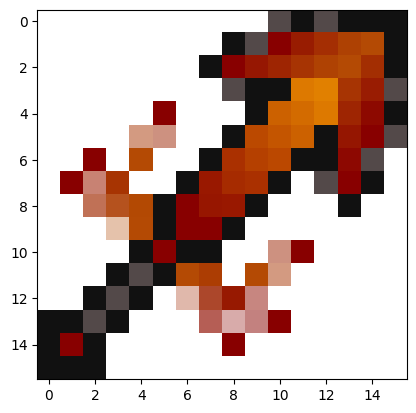

In [4]:
print(dataset)
plt.imshow(dataset[0][0])

Noise the image

In [5]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.005):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [6]:
IMG_SIZE = 32
BATCH_SIZE = 16

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    dataset = datasets.ImageFolder(root="minecraft_textures", loader=custom_loader, transform=data_transform)

    return dataset
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

<ipython-input-15-c9972e9f173a>:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1)


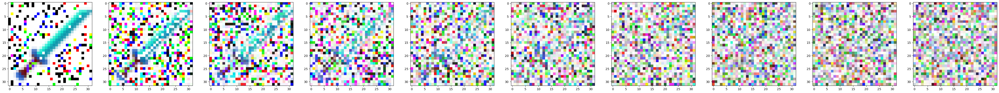

In [15]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(64, 64))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

Denoise Model

In [8]:
from operator import xor
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1) # stride = 2 => img size *(2) cuz padding = 1
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1) # stride = 2 => img size *(1/2) cuz padding = 1
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # print("before:", x.shape)
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # print("step1", h.shape)
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # print("step2", h.shape)
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        # print("step3:", h.shape)
        h = self.transform(h)
        # print("after:", h.shape)
        return h


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 4
        down_channels = (64, 128, 256, 512)
        up_channels = (512, 256, 128, 64)
        out_dim = 4
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim), # input: float output: vector floats -1 to 1
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], time_emb_dim) for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], time_emb_dim, up=True) for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep): # input noised img and timestep
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            # print(residual_x.shape, x.shape)
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  15454308


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(4, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

In [9]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

In [10]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 4, img_size, img_size), device=device)
    plt.figure(figsize=(32,32))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

cuda


  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 0.10469523072242737 


<ipython-input-10-f1410553f8dc>:44: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


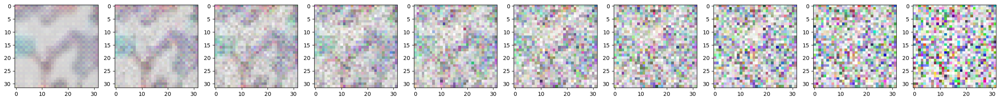

  0%|          | 5/1000 [00:24<1:15:26,  4.55s/it]

Epoch 5 | step 000 Loss: 0.1400335133075714 


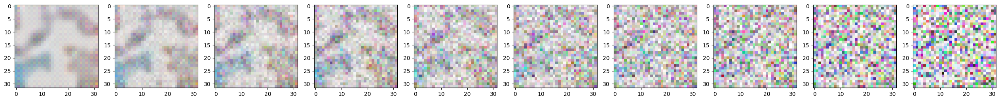

  1%|          | 10/1000 [00:48<1:14:09,  4.49s/it]

Epoch 10 | step 000 Loss: 0.15161411464214325 


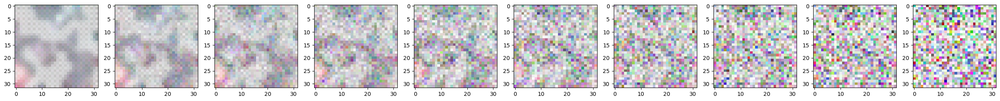

  2%|▏         | 15/1000 [01:12<1:12:59,  4.45s/it]

Epoch 15 | step 000 Loss: 0.10889451205730438 


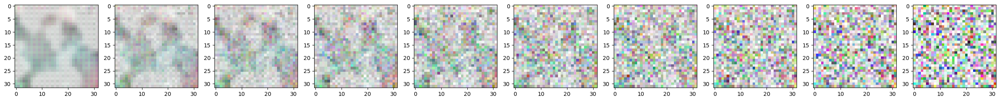

  2%|▏         | 20/1000 [01:36<1:13:29,  4.50s/it]

Epoch 20 | step 000 Loss: 0.1292882263660431 


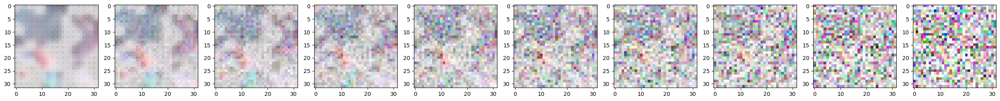

  2%|▎         | 25/1000 [02:00<1:13:04,  4.50s/it]

Epoch 25 | step 000 Loss: 0.10969648510217667 


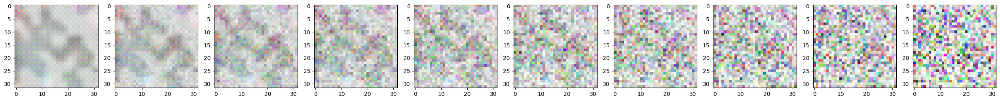

  3%|▎         | 30/1000 [02:24<1:13:10,  4.53s/it]

Epoch 30 | step 000 Loss: 0.11413316428661346 


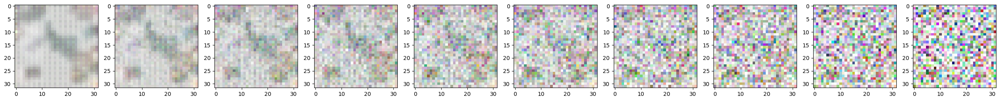

  4%|▎         | 35/1000 [02:48<1:12:07,  4.48s/it]

Epoch 35 | step 000 Loss: 0.1112704649567604 


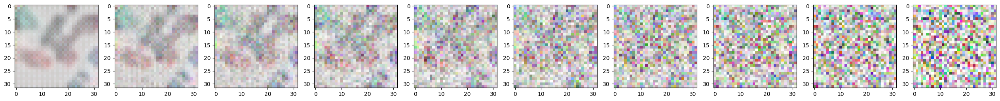

  4%|▍         | 40/1000 [03:13<1:12:36,  4.54s/it]

Epoch 40 | step 000 Loss: 0.14717142283916473 


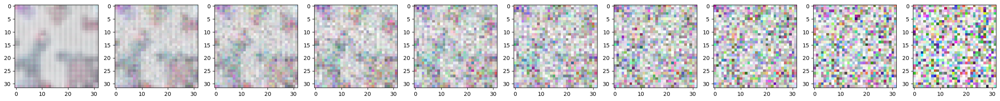

  4%|▍         | 45/1000 [03:37<1:12:21,  4.55s/it]

Epoch 45 | step 000 Loss: 0.09554695338010788 


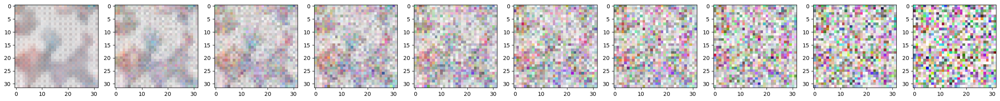

  5%|▌         | 50/1000 [04:01<1:11:48,  4.54s/it]

Epoch 50 | step 000 Loss: 0.10506594181060791 


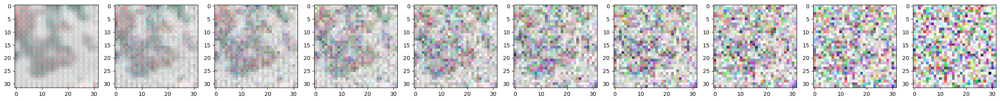

  6%|▌         | 55/1000 [04:25<1:10:45,  4.49s/it]

Epoch 55 | step 000 Loss: 0.11481820046901703 


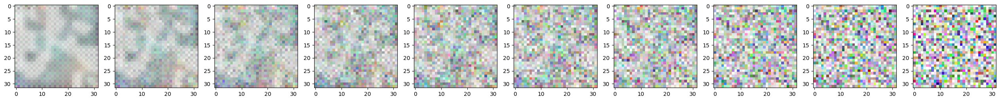

  6%|▌         | 60/1000 [04:50<1:10:32,  4.50s/it]

Epoch 60 | step 000 Loss: 0.11296871304512024 


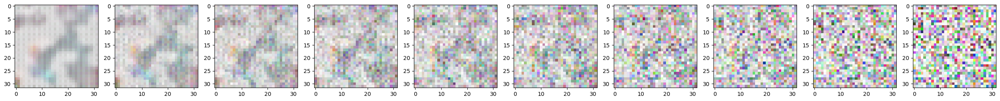

  6%|▋         | 65/1000 [05:14<1:10:48,  4.54s/it]

Epoch 65 | step 000 Loss: 0.1435576230287552 


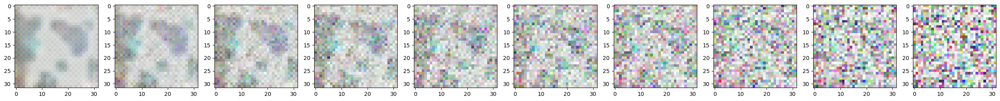

  7%|▋         | 70/1000 [05:38<1:09:58,  4.51s/it]

Epoch 70 | step 000 Loss: 0.08168789744377136 


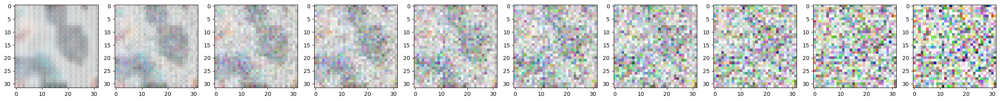

  8%|▊         | 75/1000 [06:02<1:09:54,  4.53s/it]

Epoch 75 | step 000 Loss: 0.12429976463317871 


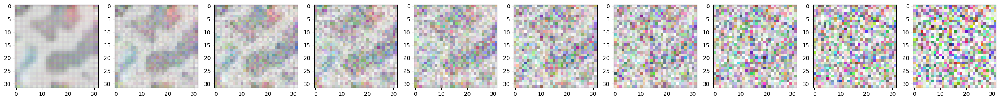

  8%|▊         | 80/1000 [06:27<1:09:27,  4.53s/it]

Epoch 80 | step 000 Loss: 0.09371831268072128 


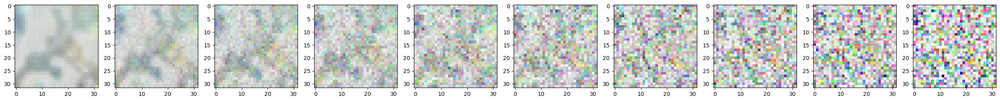

  8%|▊         | 85/1000 [06:52<1:10:18,  4.61s/it]

Epoch 85 | step 000 Loss: 0.11535913497209549 


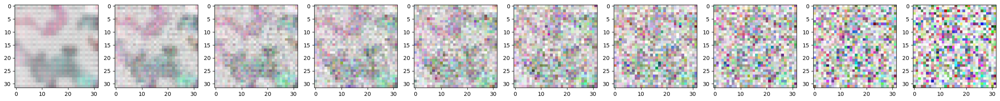

  9%|▉         | 90/1000 [07:16<1:08:42,  4.53s/it]

Epoch 90 | step 000 Loss: 0.08059559762477875 


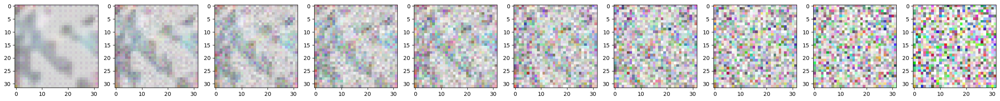

 10%|▉         | 95/1000 [07:40<1:08:34,  4.55s/it]

Epoch 95 | step 000 Loss: 0.10927911102771759 


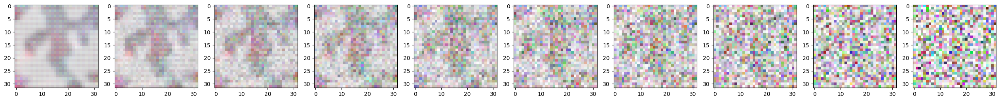

 10%|█         | 100/1000 [08:05<1:07:52,  4.52s/it]

Epoch 100 | step 000 Loss: 0.11107677221298218 


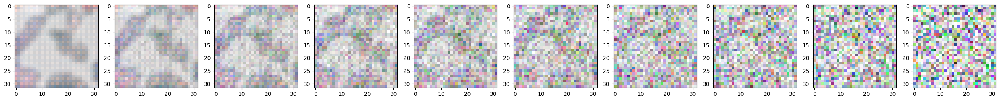

 10%|█         | 105/1000 [08:29<1:07:15,  4.51s/it]

Epoch 105 | step 000 Loss: 0.11044564843177795 


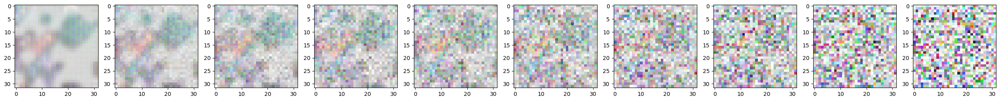

 11%|█         | 110/1000 [08:54<1:07:14,  4.53s/it]

Epoch 110 | step 000 Loss: 0.09808062016963959 


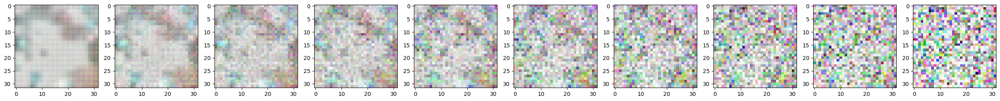

 12%|█▏        | 115/1000 [09:18<1:06:44,  4.53s/it]

Epoch 115 | step 000 Loss: 0.11658507585525513 


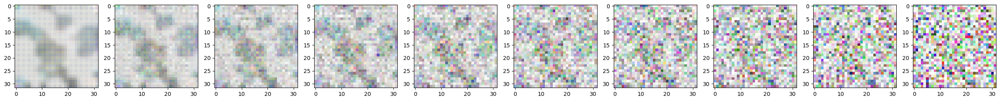

 12%|█▏        | 120/1000 [09:42<1:06:30,  4.53s/it]

Epoch 120 | step 000 Loss: 0.08451879024505615 


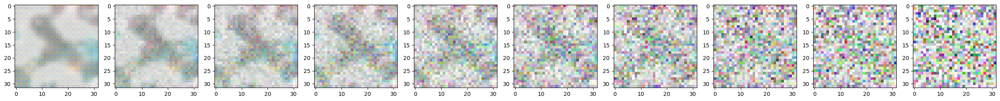

 12%|█▎        | 125/1000 [10:06<1:05:59,  4.52s/it]

Epoch 125 | step 000 Loss: 0.11963697522878647 


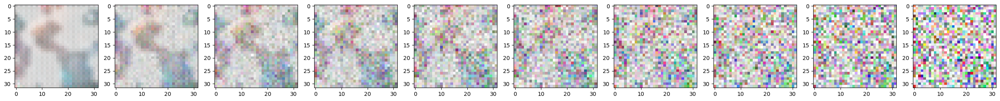

 13%|█▎        | 130/1000 [10:31<1:06:02,  4.55s/it]

Epoch 130 | step 000 Loss: 0.11420761048793793 


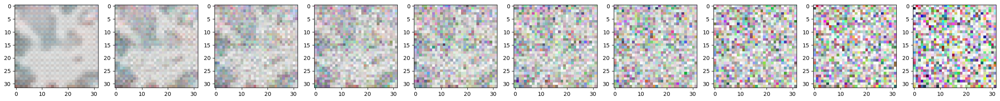

 14%|█▎        | 135/1000 [10:55<1:05:12,  4.52s/it]

Epoch 135 | step 000 Loss: 0.10864678025245667 


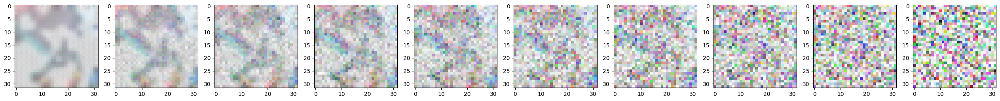

 14%|█▍        | 140/1000 [11:20<1:04:55,  4.53s/it]

Epoch 140 | step 000 Loss: 0.09197983890771866 


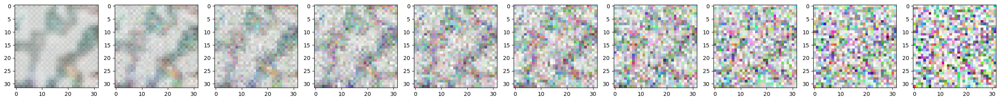

 14%|█▍        | 145/1000 [11:44<1:04:08,  4.50s/it]

Epoch 145 | step 000 Loss: 0.1060456931591034 


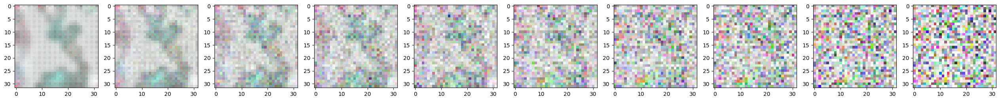

 15%|█▌        | 150/1000 [12:08<1:03:50,  4.51s/it]

Epoch 150 | step 000 Loss: 0.1276865005493164 


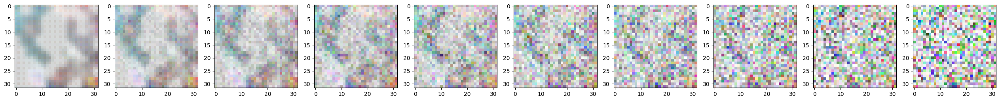

 16%|█▌        | 155/1000 [12:33<1:03:47,  4.53s/it]

Epoch 155 | step 000 Loss: 0.10179503262042999 


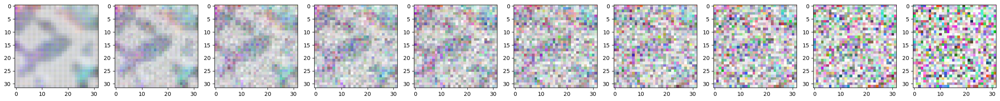

 16%|█▌        | 160/1000 [12:57<1:03:08,  4.51s/it]

Epoch 160 | step 000 Loss: 0.08459007740020752 


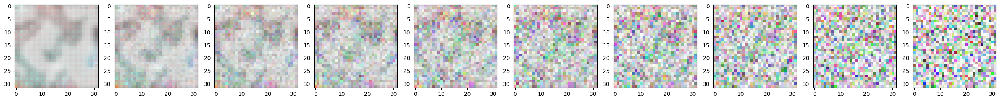

 16%|█▋        | 165/1000 [13:21<1:02:38,  4.50s/it]

Epoch 165 | step 000 Loss: 0.10197319090366364 


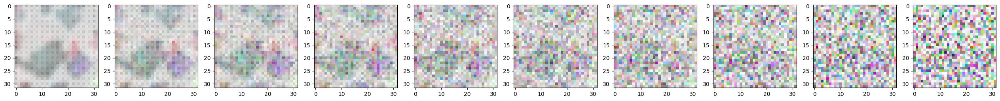

 17%|█▋        | 170/1000 [13:45<1:02:12,  4.50s/it]

Epoch 170 | step 000 Loss: 0.09898917376995087 


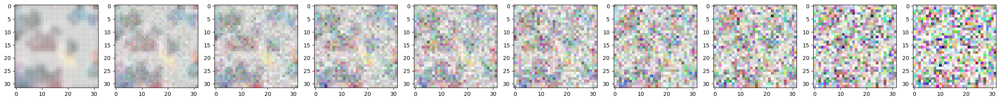

 18%|█▊        | 175/1000 [14:09<1:02:12,  4.52s/it]

Epoch 175 | step 000 Loss: 0.08726063370704651 


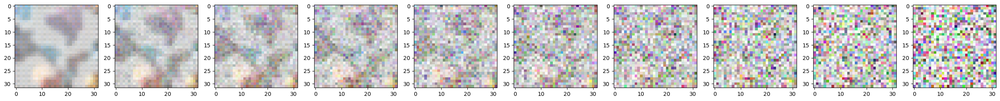

 18%|█▊        | 180/1000 [14:34<1:01:38,  4.51s/it]

Epoch 180 | step 000 Loss: 0.0936451330780983 


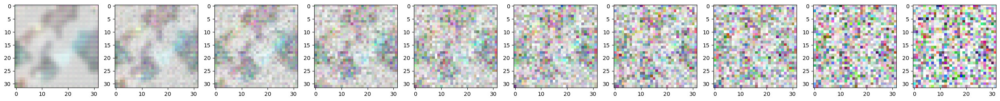

 18%|█▊        | 185/1000 [14:58<1:01:22,  4.52s/it]

Epoch 185 | step 000 Loss: 0.09062235057353973 


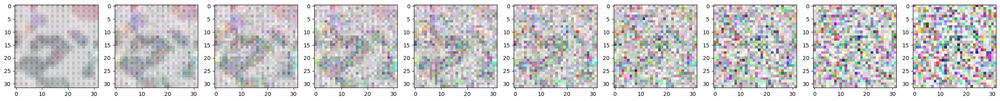

 19%|█▉        | 190/1000 [15:22<1:00:28,  4.48s/it]

Epoch 190 | step 000 Loss: 0.08863331377506256 


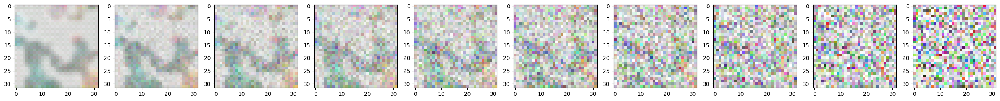

 20%|█▉        | 195/1000 [15:46<1:00:54,  4.54s/it]

Epoch 195 | step 000 Loss: 0.09604928642511368 


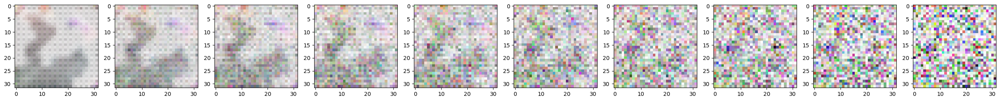

 20%|██        | 200/1000 [16:11<1:00:07,  4.51s/it]

Epoch 200 | step 000 Loss: 0.0845719426870346 


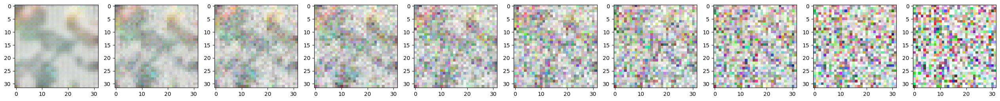

 20%|██        | 205/1000 [16:34<59:32,  4.49s/it]  

Epoch 205 | step 000 Loss: 0.0892331600189209 


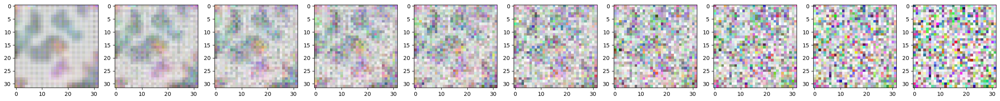

 21%|██        | 210/1000 [16:58<58:55,  4.48s/it]  

Epoch 210 | step 000 Loss: 0.07399005442857742 


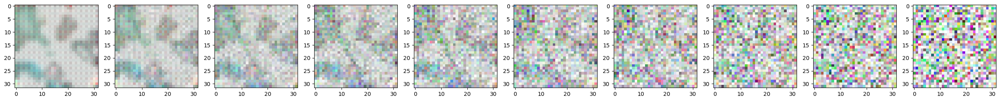

 22%|██▏       | 215/1000 [17:23<58:45,  4.49s/it]  

Epoch 215 | step 000 Loss: 0.0920839011669159 


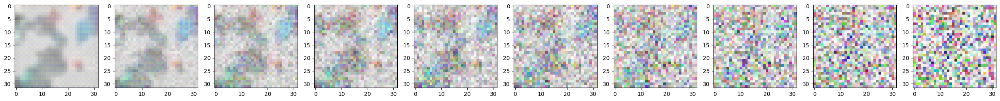

 22%|██▏       | 220/1000 [17:47<58:43,  4.52s/it]  

Epoch 220 | step 000 Loss: 0.07823774218559265 


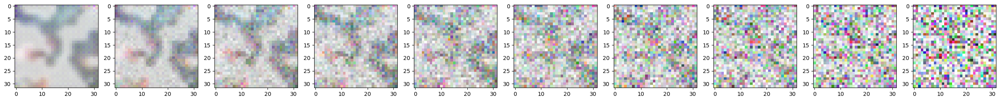

 22%|██▎       | 225/1000 [18:11<58:16,  4.51s/it]

Epoch 225 | step 000 Loss: 0.1034439355134964 


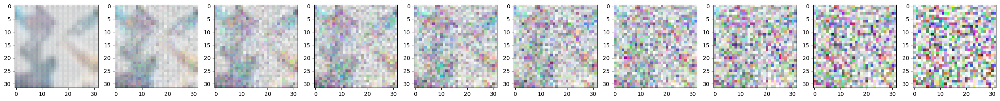

 23%|██▎       | 230/1000 [18:35<57:33,  4.48s/it]

Epoch 230 | step 000 Loss: 0.14373552799224854 


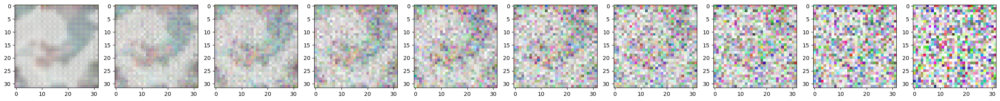

 24%|██▎       | 235/1000 [18:59<57:08,  4.48s/it]

Epoch 235 | step 000 Loss: 0.08708421140909195 


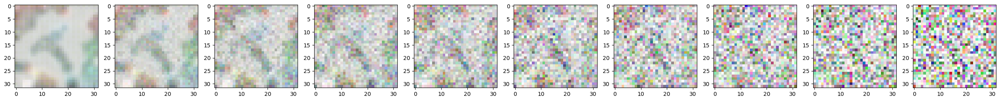

 24%|██▍       | 240/1000 [19:24<57:27,  4.54s/it]

Epoch 240 | step 000 Loss: 0.10264381021261215 


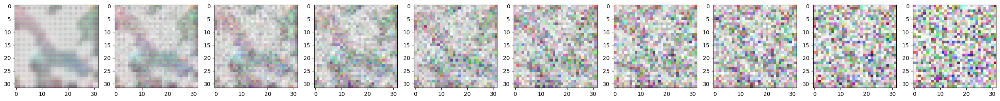

 24%|██▍       | 245/1000 [19:48<56:48,  4.51s/it]

Epoch 245 | step 000 Loss: 0.1204972043633461 


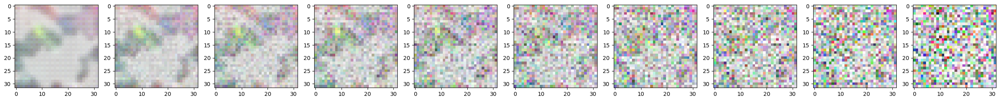

 25%|██▌       | 250/1000 [20:12<56:33,  4.53s/it]

Epoch 250 | step 000 Loss: 0.07899262756109238 


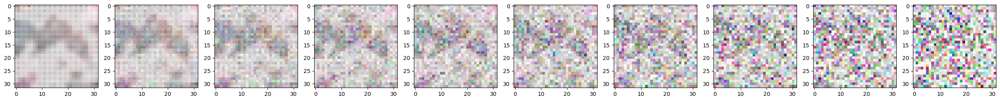

 26%|██▌       | 255/1000 [20:36<55:31,  4.47s/it]

Epoch 255 | step 000 Loss: 0.1033066064119339 


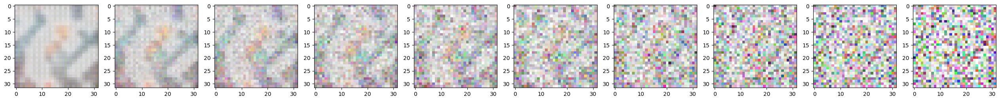

 26%|██▌       | 260/1000 [21:01<55:56,  4.54s/it]

Epoch 260 | step 000 Loss: 0.09931118041276932 


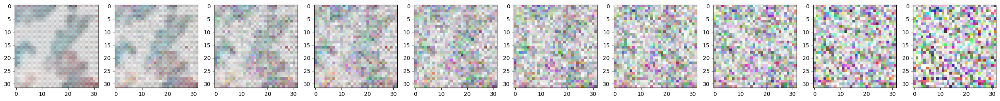

 26%|██▋       | 265/1000 [21:25<54:56,  4.49s/it]

Epoch 265 | step 000 Loss: 0.0845477283000946 


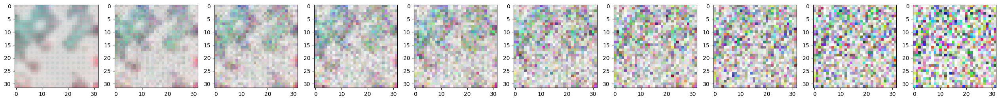

 27%|██▋       | 270/1000 [21:49<54:53,  4.51s/it]

Epoch 270 | step 000 Loss: 0.10073920339345932 


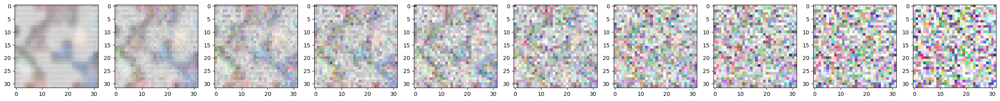

 28%|██▊       | 275/1000 [22:12<53:56,  4.46s/it]

Epoch 275 | step 000 Loss: 0.11308826506137848 


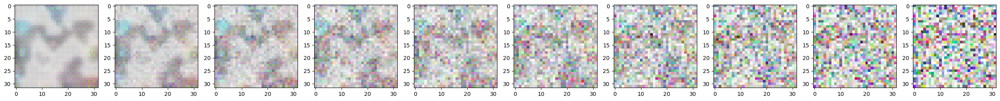

 28%|██▊       | 280/1000 [22:37<53:56,  4.49s/it]

Epoch 280 | step 000 Loss: 0.0824095606803894 


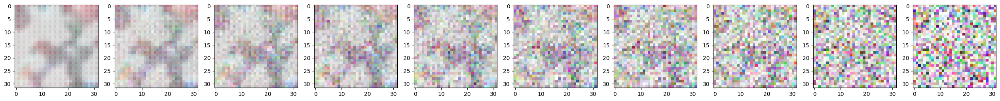

 28%|██▊       | 285/1000 [23:01<53:44,  4.51s/it]

Epoch 285 | step 000 Loss: 0.094127357006073 


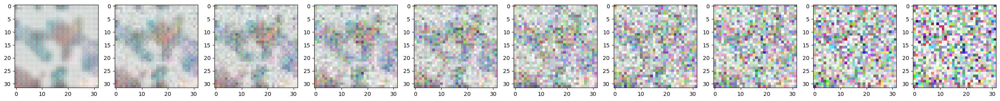

 29%|██▉       | 290/1000 [23:25<53:37,  4.53s/it]

Epoch 290 | step 000 Loss: 0.08121691644191742 


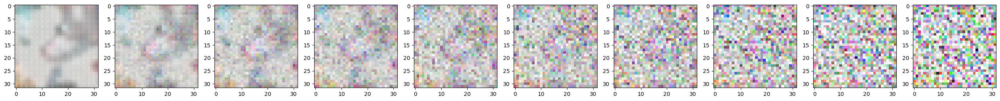

 30%|██▉       | 295/1000 [23:49<52:46,  4.49s/it]

Epoch 295 | step 000 Loss: 0.09478829801082611 


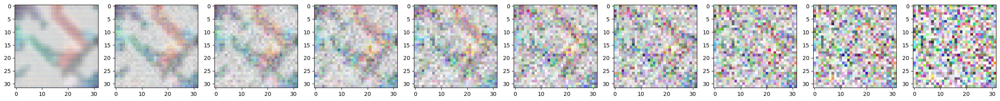

 30%|███       | 300/1000 [24:13<52:06,  4.47s/it]

Epoch 300 | step 000 Loss: 0.08415955305099487 


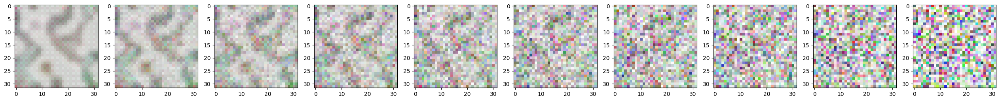

 30%|███       | 305/1000 [24:38<52:22,  4.52s/it]

Epoch 305 | step 000 Loss: 0.08870083093643188 


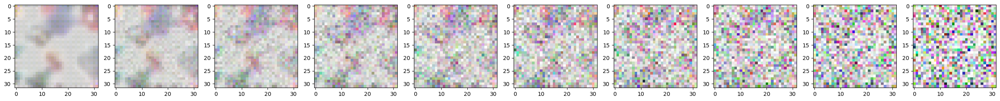

 31%|███       | 310/1000 [25:02<51:37,  4.49s/it]

Epoch 310 | step 000 Loss: 0.08681369572877884 


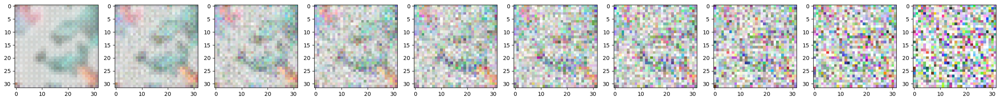

 32%|███▏      | 315/1000 [25:26<51:26,  4.51s/it]

Epoch 315 | step 000 Loss: 0.10780629515647888 


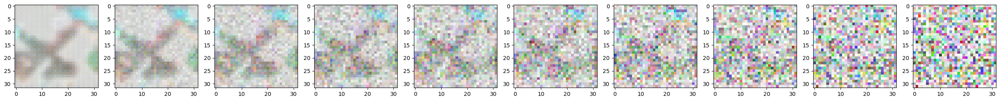

 32%|███▏      | 320/1000 [25:49<50:24,  4.45s/it]

Epoch 320 | step 000 Loss: 0.08410771936178207 


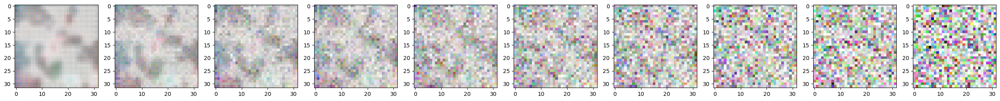

 32%|███▎      | 325/1000 [26:14<50:42,  4.51s/it]

Epoch 325 | step 000 Loss: 0.09400365501642227 


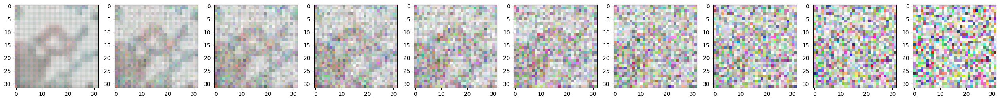

 33%|███▎      | 330/1000 [26:38<49:56,  4.47s/it]

Epoch 330 | step 000 Loss: 0.09641991555690765 


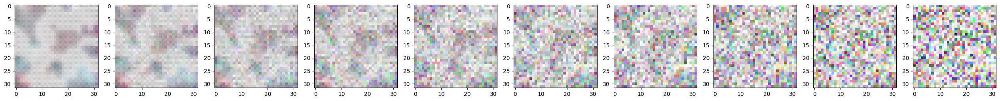

 34%|███▎      | 335/1000 [27:02<50:02,  4.51s/it]

Epoch 335 | step 000 Loss: 0.11536543816328049 


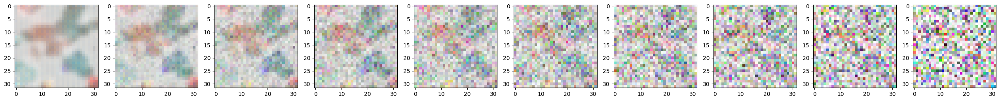

 34%|███▍      | 340/1000 [27:26<49:13,  4.47s/it]

Epoch 340 | step 000 Loss: 0.0901515930891037 


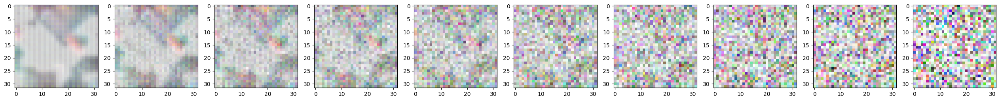

 34%|███▍      | 345/1000 [27:50<48:58,  4.49s/it]

Epoch 345 | step 000 Loss: 0.07779987156391144 


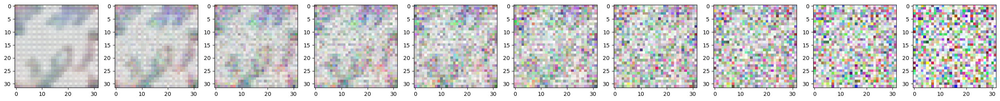

 35%|███▌      | 350/1000 [28:15<48:54,  4.51s/it]

Epoch 350 | step 000 Loss: 0.08680527657270432 


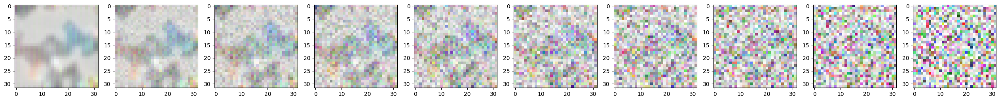

 36%|███▌      | 355/1000 [28:39<48:28,  4.51s/it]

Epoch 355 | step 000 Loss: 0.10103330761194229 


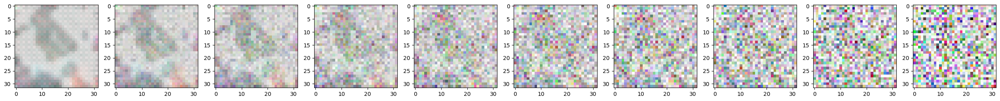

 36%|███▌      | 360/1000 [29:03<48:01,  4.50s/it]

Epoch 360 | step 000 Loss: 0.1197434812784195 


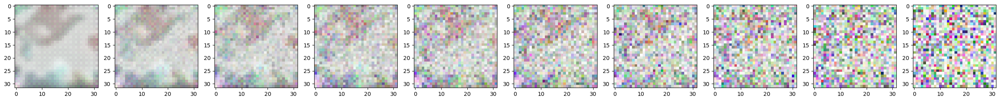

 36%|███▋      | 365/1000 [29:27<47:23,  4.48s/it]

Epoch 365 | step 000 Loss: 0.09905644506216049 


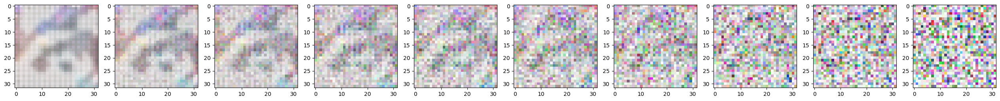

 37%|███▋      | 370/1000 [29:51<47:33,  4.53s/it]

Epoch 370 | step 000 Loss: 0.10164422541856766 


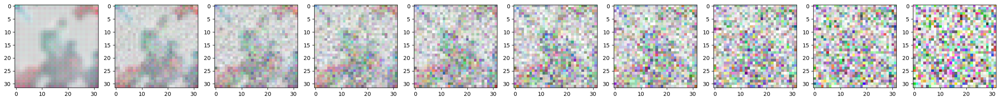

 38%|███▊      | 375/1000 [30:15<46:45,  4.49s/it]

Epoch 375 | step 000 Loss: 0.08581134676933289 


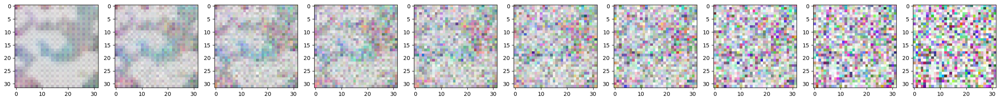

 38%|███▊      | 380/1000 [30:39<46:37,  4.51s/it]

Epoch 380 | step 000 Loss: 0.08661586791276932 


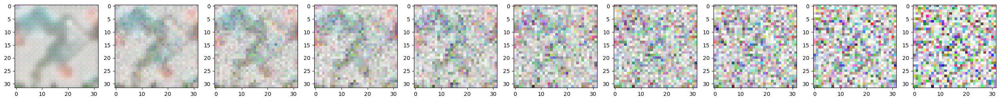

 38%|███▊      | 385/1000 [31:03<45:53,  4.48s/it]

Epoch 385 | step 000 Loss: 0.08783607184886932 


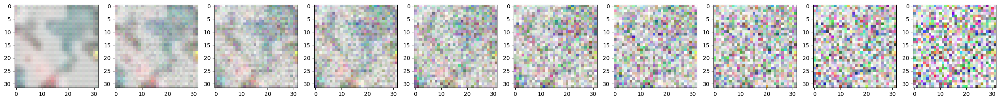

 39%|███▉      | 390/1000 [31:28<46:00,  4.53s/it]

Epoch 390 | step 000 Loss: 0.07341368496417999 


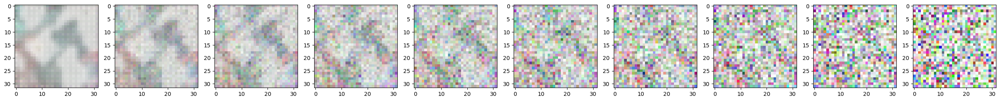

 40%|███▉      | 395/1000 [31:52<45:40,  4.53s/it]

Epoch 395 | step 000 Loss: 0.09247246384620667 


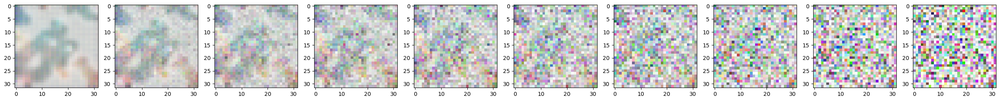

 40%|████      | 400/1000 [32:16<45:32,  4.55s/it]

Epoch 400 | step 000 Loss: 0.0762559324502945 


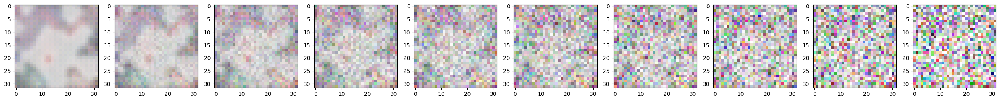

 40%|████      | 405/1000 [32:41<44:55,  4.53s/it]

Epoch 405 | step 000 Loss: 0.09036090970039368 


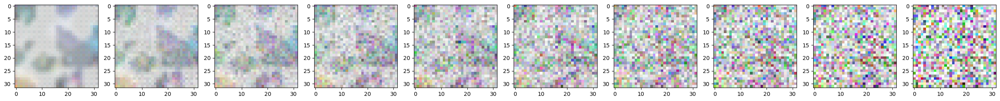

 41%|████      | 410/1000 [33:05<44:22,  4.51s/it]

Epoch 410 | step 000 Loss: 0.07619255781173706 


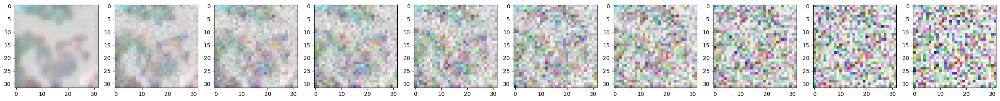

 42%|████▏     | 415/1000 [33:30<44:23,  4.55s/it]

Epoch 415 | step 000 Loss: 0.09197644889354706 


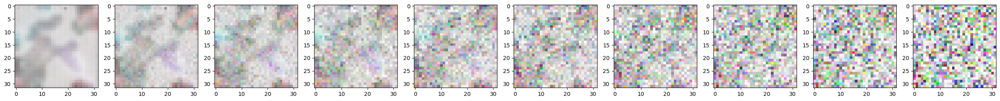

 42%|████▏     | 420/1000 [33:54<43:42,  4.52s/it]

Epoch 420 | step 000 Loss: 0.08264139294624329 


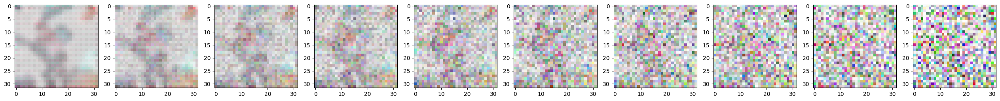

 42%|████▎     | 425/1000 [34:18<43:10,  4.50s/it]

Epoch 425 | step 000 Loss: 0.10943946242332458 


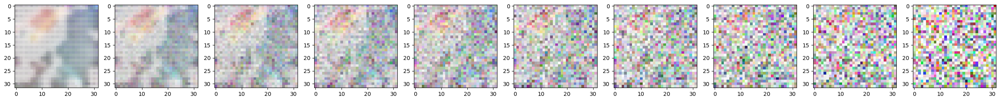

 43%|████▎     | 430/1000 [34:42<42:32,  4.48s/it]

Epoch 430 | step 000 Loss: 0.07567913085222244 


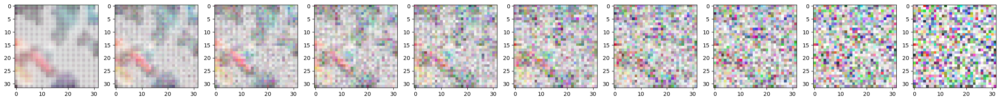

 44%|████▎     | 435/1000 [35:06<42:50,  4.55s/it]

Epoch 435 | step 000 Loss: 0.08989841490983963 


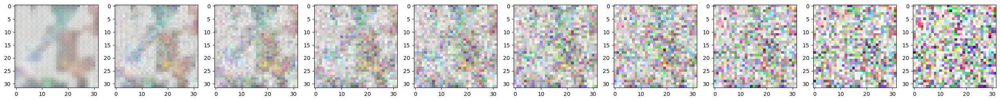

 44%|████▍     | 440/1000 [35:31<42:11,  4.52s/it]

Epoch 440 | step 000 Loss: 0.12097861617803574 


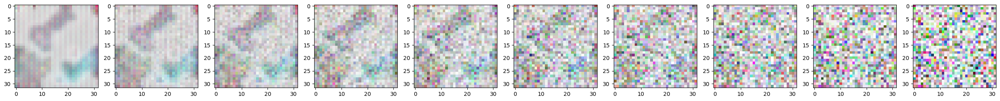

 44%|████▍     | 445/1000 [35:55<41:44,  4.51s/it]

Epoch 445 | step 000 Loss: 0.12137052416801453 


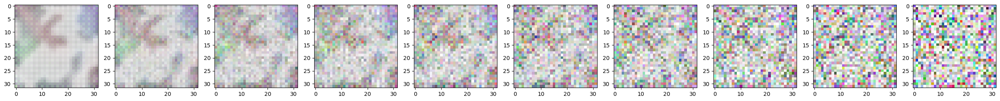

 45%|████▌     | 450/1000 [36:19<41:09,  4.49s/it]

Epoch 450 | step 000 Loss: 0.11903749406337738 


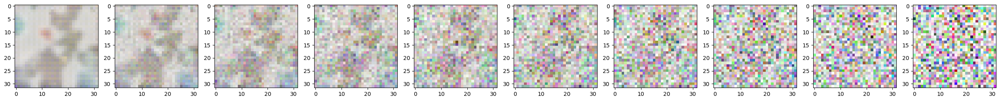

 46%|████▌     | 455/1000 [36:43<41:10,  4.53s/it]

Epoch 455 | step 000 Loss: 0.09245461225509644 


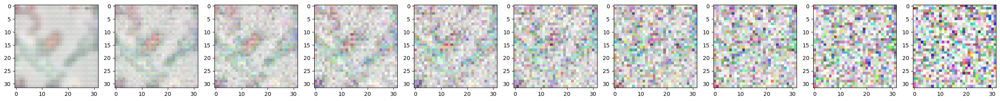

 46%|████▌     | 460/1000 [37:08<40:40,  4.52s/it]

Epoch 460 | step 000 Loss: 0.07187339663505554 


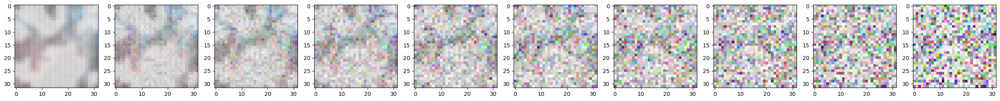

 46%|████▋     | 465/1000 [37:32<40:20,  4.52s/it]

Epoch 465 | step 000 Loss: 0.06835310906171799 


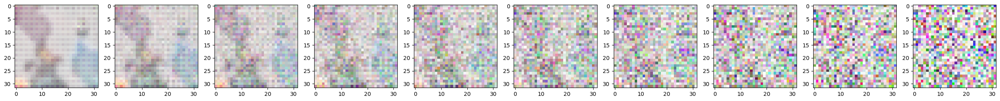

 47%|████▋     | 470/1000 [37:56<39:38,  4.49s/it]

Epoch 470 | step 000 Loss: 0.0798501968383789 


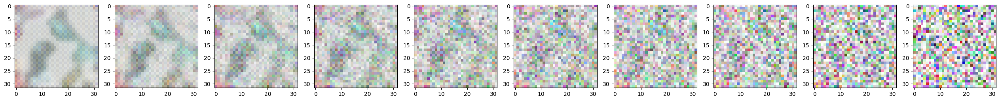

 48%|████▊     | 475/1000 [38:20<39:11,  4.48s/it]

Epoch 475 | step 000 Loss: 0.06526418775320053 


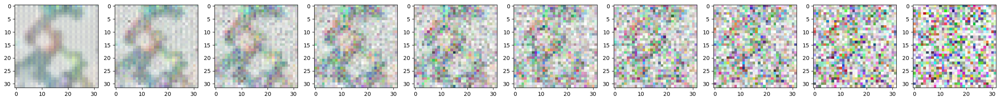

 48%|████▊     | 480/1000 [38:44<39:12,  4.52s/it]

Epoch 480 | step 000 Loss: 0.10504855960607529 


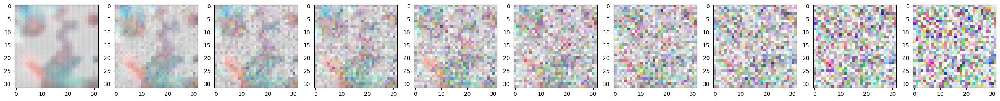

 48%|████▊     | 485/1000 [39:09<38:39,  4.50s/it]

Epoch 485 | step 000 Loss: 0.0766306072473526 


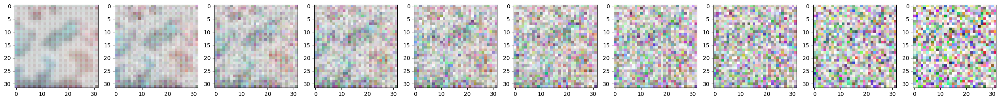

 49%|████▉     | 490/1000 [39:33<38:28,  4.53s/it]

Epoch 490 | step 000 Loss: 0.09626038372516632 


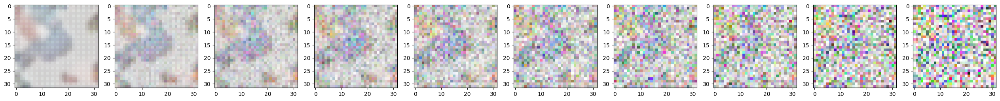

 50%|████▉     | 495/1000 [39:57<37:43,  4.48s/it]

Epoch 495 | step 000 Loss: 0.09042942523956299 


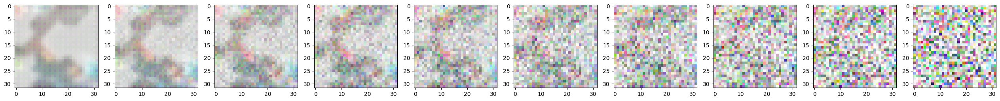

 50%|█████     | 500/1000 [40:21<37:34,  4.51s/it]

Epoch 500 | step 000 Loss: 0.08808666467666626 


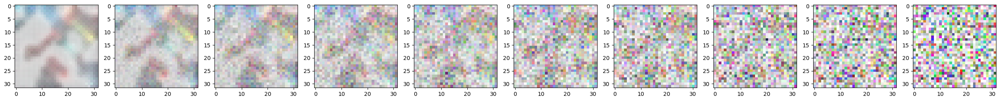

 50%|█████     | 505/1000 [40:45<37:02,  4.49s/it]

Epoch 505 | step 000 Loss: 0.11744888871908188 


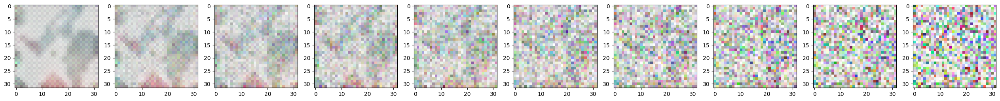

 51%|█████     | 510/1000 [41:09<36:40,  4.49s/it]

Epoch 510 | step 000 Loss: 0.07404334843158722 


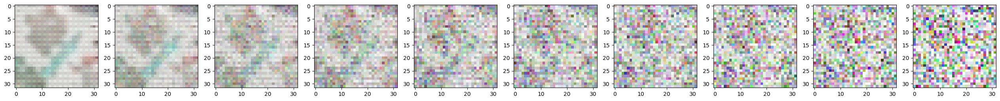

 52%|█████▏    | 515/1000 [41:33<36:15,  4.49s/it]

Epoch 515 | step 000 Loss: 0.06989605724811554 


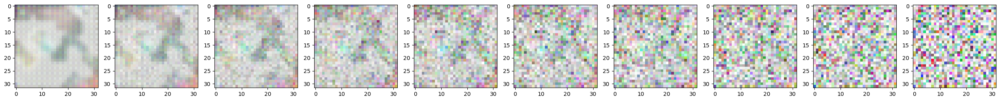

 52%|█████▏    | 520/1000 [41:58<36:34,  4.57s/it]

Epoch 520 | step 000 Loss: 0.07219862937927246 


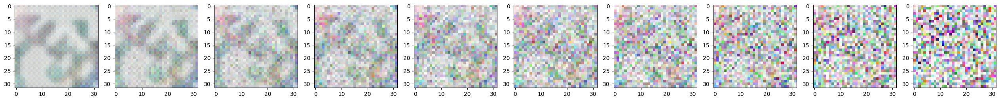

 52%|█████▎    | 525/1000 [42:22<35:38,  4.50s/it]

Epoch 525 | step 000 Loss: 0.07894520461559296 


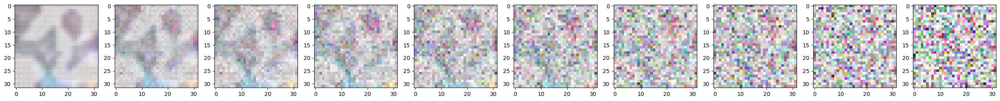

 53%|█████▎    | 530/1000 [42:46<35:24,  4.52s/it]

Epoch 530 | step 000 Loss: 0.07583953440189362 


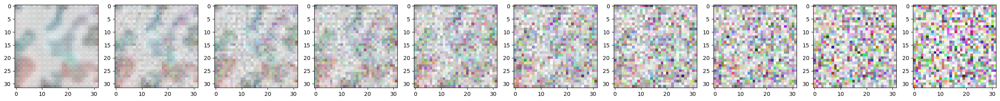

 54%|█████▎    | 535/1000 [43:10<34:41,  4.48s/it]

Epoch 535 | step 000 Loss: 0.07883619517087936 


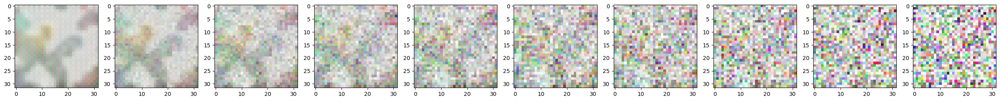

 54%|█████▍    | 540/1000 [43:35<34:31,  4.50s/it]

Epoch 540 | step 000 Loss: 0.10097502917051315 


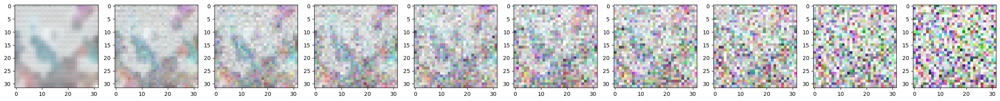

 55%|█████▍    | 545/1000 [43:59<34:23,  4.53s/it]

Epoch 545 | step 000 Loss: 0.06542057543992996 


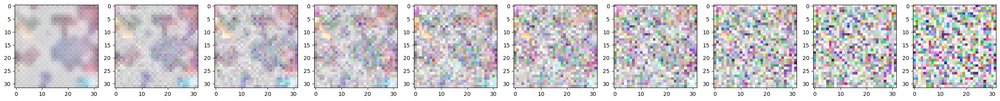

 55%|█████▌    | 550/1000 [44:23<33:55,  4.52s/it]

Epoch 550 | step 000 Loss: 0.08943172544240952 


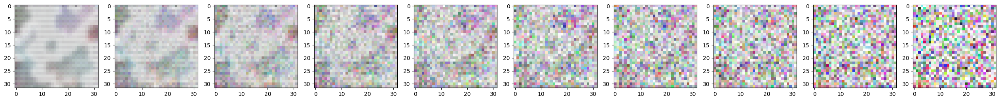

 56%|█████▌    | 555/1000 [44:47<33:14,  4.48s/it]

Epoch 555 | step 000 Loss: 0.10157471895217896 


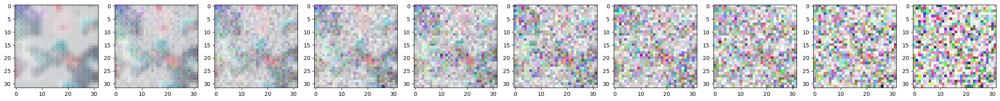

 56%|█████▌    | 560/1000 [45:11<32:56,  4.49s/it]

Epoch 560 | step 000 Loss: 0.09576549381017685 


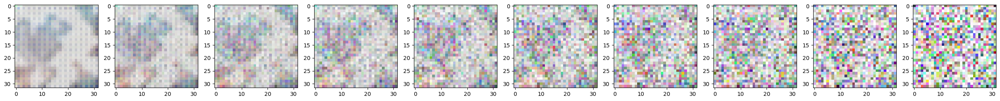

 56%|█████▋    | 565/1000 [45:36<32:51,  4.53s/it]

Epoch 565 | step 000 Loss: 0.11585437506437302 


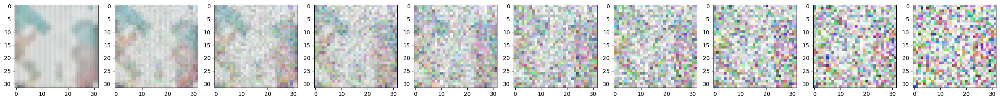

 57%|█████▋    | 570/1000 [46:00<32:19,  4.51s/it]

Epoch 570 | step 000 Loss: 0.07894159108400345 


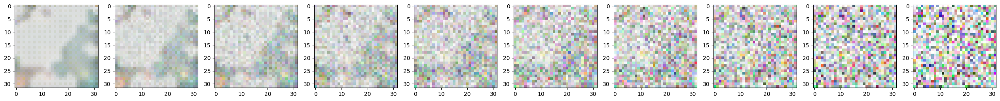

 57%|█████▊    | 575/1000 [46:24<32:00,  4.52s/it]

Epoch 575 | step 000 Loss: 0.1282099336385727 


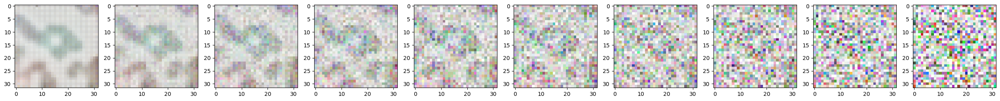

 58%|█████▊    | 580/1000 [46:48<31:18,  4.47s/it]

Epoch 580 | step 000 Loss: 0.06527967005968094 


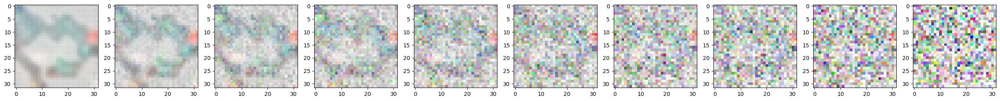

 58%|█████▊    | 585/1000 [47:13<31:30,  4.55s/it]

Epoch 585 | step 000 Loss: 0.06850531697273254 


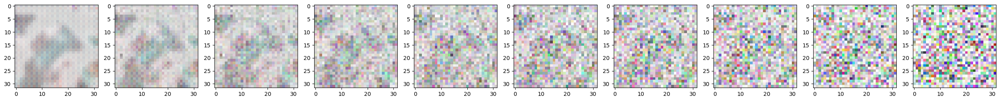

 59%|█████▉    | 590/1000 [47:37<30:51,  4.52s/it]

Epoch 590 | step 000 Loss: 0.08064505457878113 


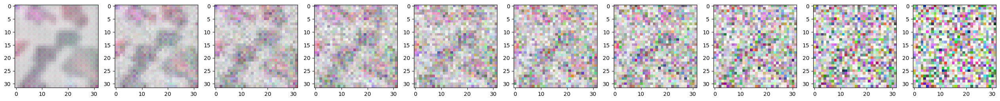

 60%|█████▉    | 595/1000 [48:02<30:55,  4.58s/it]

Epoch 595 | step 000 Loss: 0.1121191680431366 


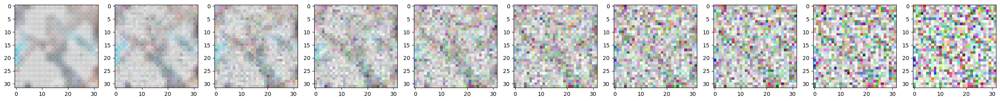

 60%|██████    | 600/1000 [48:26<29:59,  4.50s/it]

Epoch 600 | step 000 Loss: 0.07809868454933167 


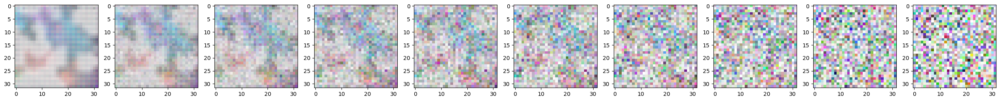

 60%|██████    | 605/1000 [48:50<29:36,  4.50s/it]

Epoch 605 | step 000 Loss: 0.08483424782752991 


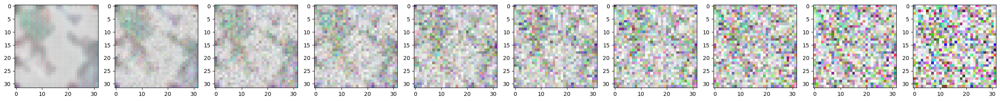

 61%|██████    | 610/1000 [49:15<29:33,  4.55s/it]

Epoch 610 | step 000 Loss: 0.06496955454349518 


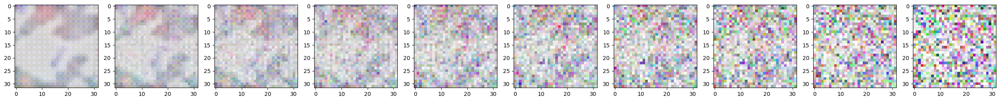

 62%|██████▏   | 615/1000 [49:39<28:52,  4.50s/it]

Epoch 615 | step 000 Loss: 0.08777852356433868 


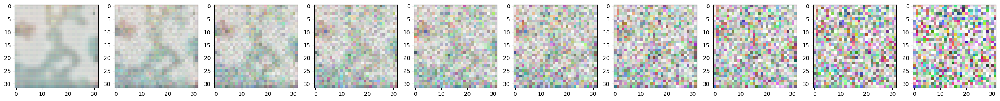

 62%|██████▏   | 620/1000 [50:03<28:36,  4.52s/it]

Epoch 620 | step 000 Loss: 0.09840569645166397 


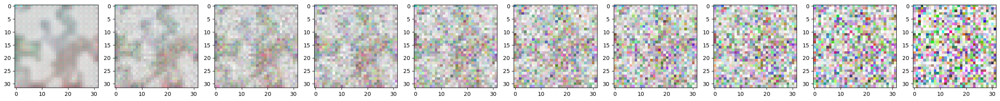

 62%|██████▎   | 625/1000 [50:27<27:55,  4.47s/it]

Epoch 625 | step 000 Loss: 0.0763545036315918 


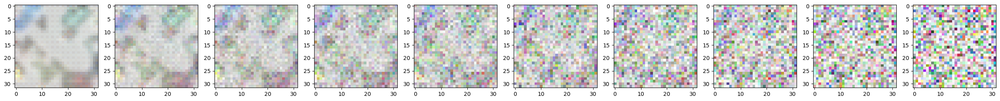

 63%|██████▎   | 630/1000 [50:52<28:03,  4.55s/it]

Epoch 630 | step 000 Loss: 0.06407266855239868 


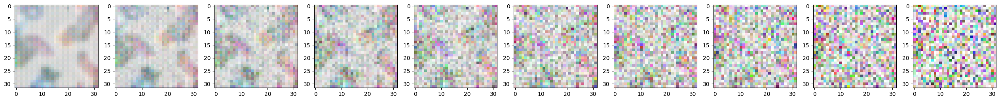

 64%|██████▎   | 635/1000 [51:16<27:27,  4.51s/it]

Epoch 635 | step 000 Loss: 0.06214775890111923 


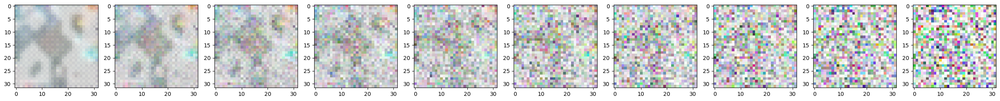

 64%|██████▍   | 640/1000 [51:40<27:08,  4.52s/it]

Epoch 640 | step 000 Loss: 0.08175154030323029 


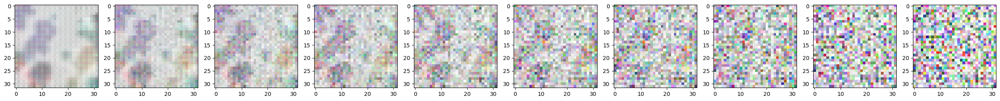

 64%|██████▍   | 645/1000 [52:04<26:27,  4.47s/it]

Epoch 645 | step 000 Loss: 0.08897993713617325 


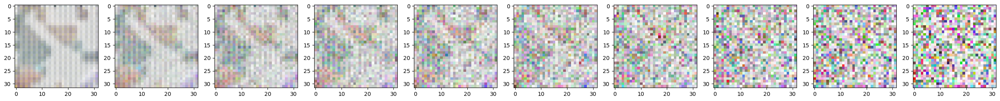

 65%|██████▌   | 650/1000 [52:28<26:18,  4.51s/it]

Epoch 650 | step 000 Loss: 0.07327877730131149 


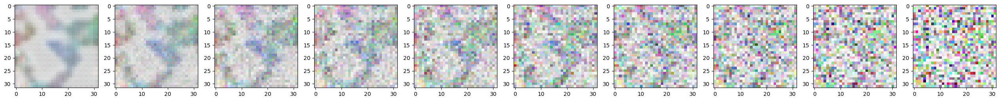

 66%|██████▌   | 655/1000 [52:53<25:57,  4.51s/it]

Epoch 655 | step 000 Loss: 0.07221382856369019 


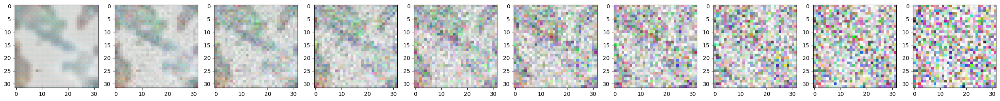

 66%|██████▌   | 660/1000 [53:18<25:49,  4.56s/it]

Epoch 660 | step 000 Loss: 0.0756305679678917 


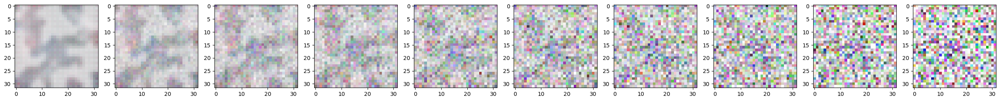

 66%|██████▋   | 665/1000 [53:42<25:09,  4.51s/it]

Epoch 665 | step 000 Loss: 0.06969399750232697 


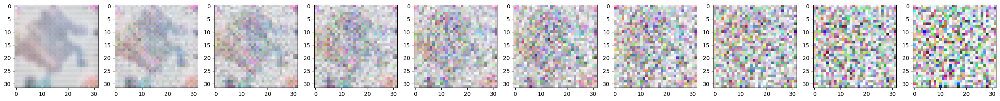

 67%|██████▋   | 670/1000 [54:06<24:38,  4.48s/it]

Epoch 670 | step 000 Loss: 0.08682133257389069 


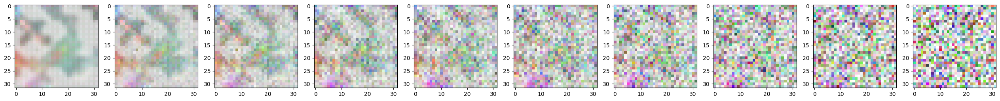

 68%|██████▊   | 675/1000 [54:30<24:37,  4.55s/it]

Epoch 675 | step 000 Loss: 0.0981987863779068 


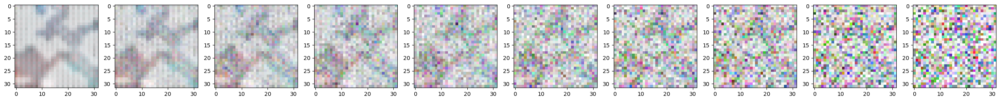

 68%|██████▊   | 680/1000 [54:55<24:02,  4.51s/it]

Epoch 680 | step 000 Loss: 0.07141934335231781 


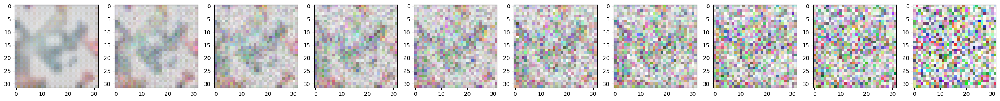

 68%|██████▊   | 685/1000 [55:19<23:38,  4.50s/it]

Epoch 685 | step 000 Loss: 0.07133208215236664 


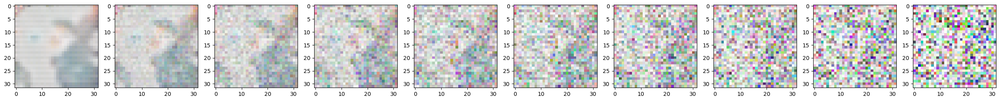

 69%|██████▉   | 690/1000 [55:42<23:06,  4.47s/it]

Epoch 690 | step 000 Loss: 0.08309468626976013 


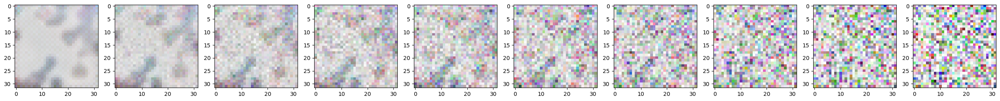

 70%|██████▉   | 695/1000 [56:07<22:58,  4.52s/it]

Epoch 695 | step 000 Loss: 0.07221578061580658 


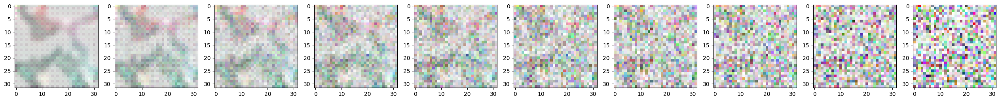

 70%|███████   | 700/1000 [56:31<22:39,  4.53s/it]

Epoch 700 | step 000 Loss: 0.1000409871339798 


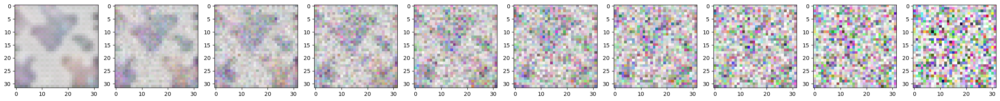

 70%|███████   | 705/1000 [56:55<22:07,  4.50s/it]

Epoch 705 | step 000 Loss: 0.12478796392679214 


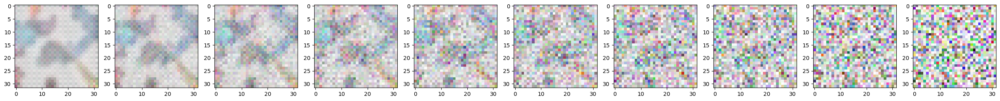

 71%|███████   | 710/1000 [57:19<21:37,  4.47s/it]

Epoch 710 | step 000 Loss: 0.06956187635660172 


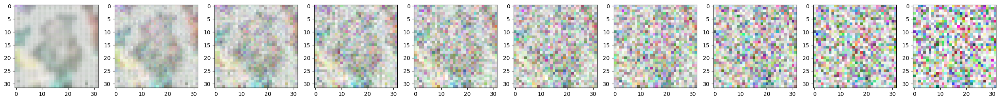

 72%|███████▏  | 715/1000 [57:44<21:26,  4.52s/it]

Epoch 715 | step 000 Loss: 0.0746588259935379 


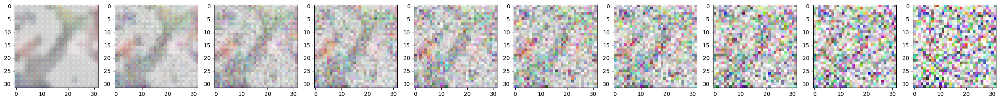

 72%|███████▏  | 720/1000 [58:08<20:59,  4.50s/it]

Epoch 720 | step 000 Loss: 0.08394621312618256 


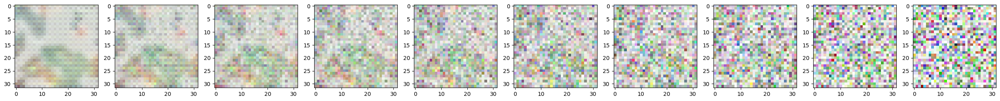

 72%|███████▎  | 725/1000 [58:32<21:21,  4.66s/it]

Epoch 725 | step 000 Loss: 0.07557119429111481 


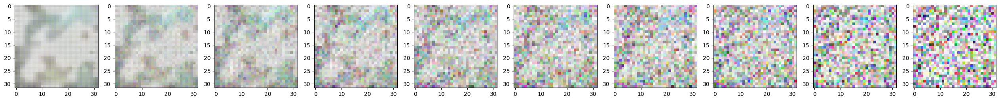

 73%|███████▎  | 730/1000 [58:56<20:15,  4.50s/it]

Epoch 730 | step 000 Loss: 0.06854180991649628 


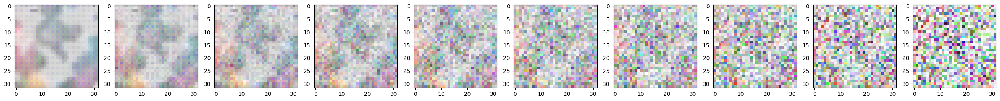

 74%|███████▎  | 735/1000 [59:21<20:03,  4.54s/it]

Epoch 735 | step 000 Loss: 0.058820053935050964 


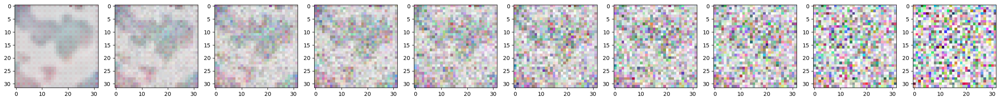

 74%|███████▍  | 740/1000 [59:45<19:29,  4.50s/it]

Epoch 740 | step 000 Loss: 0.09810139238834381 


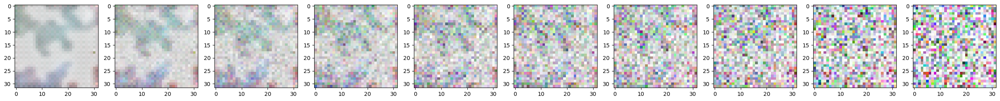

 74%|███████▍  | 745/1000 [1:00:09<19:13,  4.52s/it]

Epoch 745 | step 000 Loss: 0.0865020751953125 


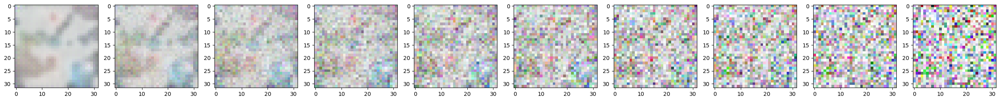

 75%|███████▌  | 750/1000 [1:00:33<18:36,  4.46s/it]

Epoch 750 | step 000 Loss: 0.07568053901195526 


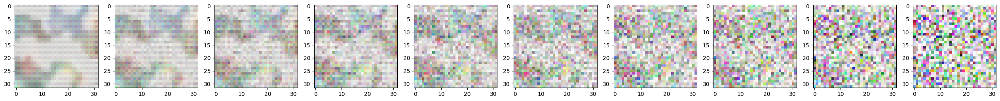

 76%|███████▌  | 755/1000 [1:00:58<18:28,  4.52s/it]

Epoch 755 | step 000 Loss: 0.07355190068483353 


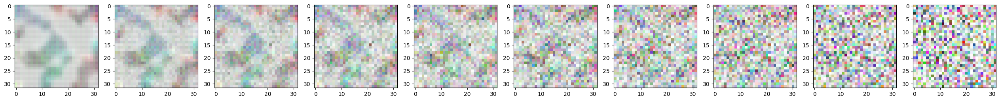

 76%|███████▌  | 760/1000 [1:01:22<17:58,  4.49s/it]

Epoch 760 | step 000 Loss: 0.08567298948764801 


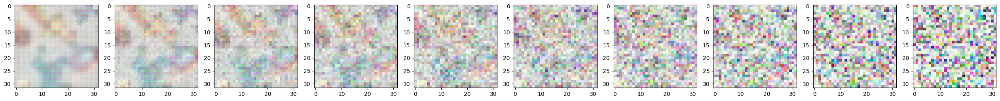

 76%|███████▋  | 765/1000 [1:01:46<17:41,  4.52s/it]

Epoch 765 | step 000 Loss: 0.07711279392242432 


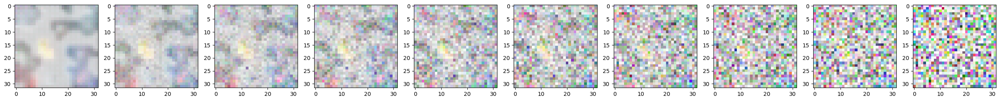

 77%|███████▋  | 770/1000 [1:02:10<17:11,  4.48s/it]

Epoch 770 | step 000 Loss: 0.06480149179697037 


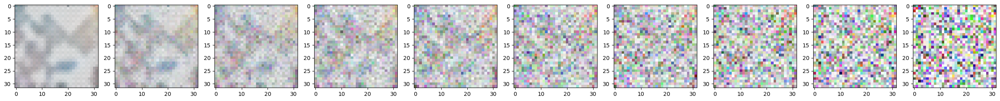

 78%|███████▊  | 775/1000 [1:02:34<16:54,  4.51s/it]

Epoch 775 | step 000 Loss: 0.09443460404872894 


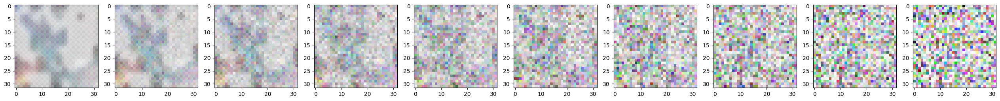

 78%|███████▊  | 780/1000 [1:02:59<16:35,  4.52s/it]

Epoch 780 | step 000 Loss: 0.06448367238044739 


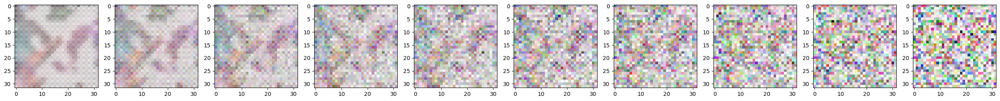

 78%|███████▊  | 785/1000 [1:03:23<16:12,  4.52s/it]

Epoch 785 | step 000 Loss: 0.07562434673309326 


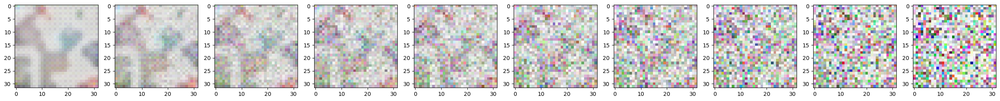

 79%|███████▉  | 790/1000 [1:03:47<15:43,  4.50s/it]

Epoch 790 | step 000 Loss: 0.08389110863208771 


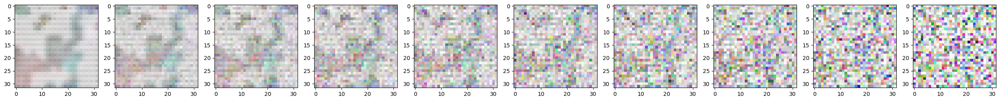

 80%|███████▉  | 795/1000 [1:04:12<15:47,  4.62s/it]

Epoch 795 | step 000 Loss: 0.07207632064819336 


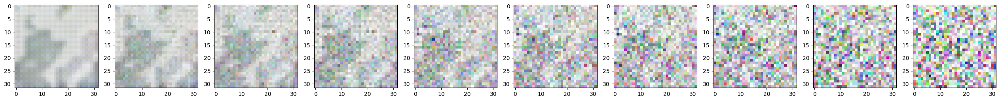

 80%|████████  | 800/1000 [1:04:36<15:03,  4.52s/it]

Epoch 800 | step 000 Loss: 0.06365619599819183 


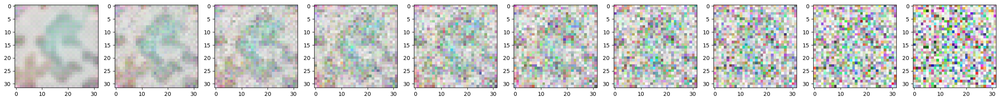

 80%|████████  | 805/1000 [1:05:00<14:40,  4.52s/it]

Epoch 805 | step 000 Loss: 0.07855680584907532 


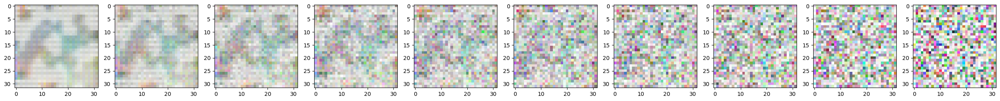

 81%|████████  | 810/1000 [1:05:24<14:09,  4.47s/it]

Epoch 810 | step 000 Loss: 0.08542229235172272 


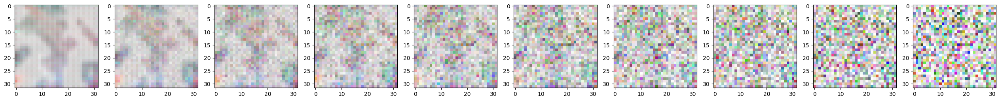

 82%|████████▏ | 815/1000 [1:05:49<13:57,  4.52s/it]

Epoch 815 | step 000 Loss: 0.08969509601593018 


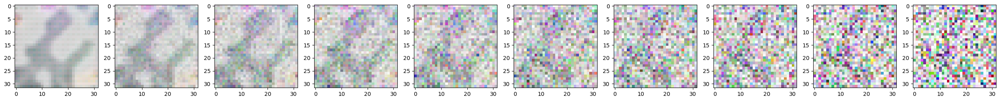

 82%|████████▏ | 820/1000 [1:06:13<13:30,  4.50s/it]

Epoch 820 | step 000 Loss: 0.07972021400928497 


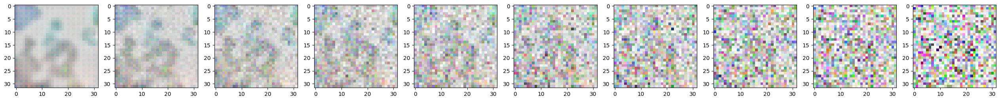

 82%|████████▎ | 825/1000 [1:06:37<13:06,  4.50s/it]

Epoch 825 | step 000 Loss: 0.09376411885023117 


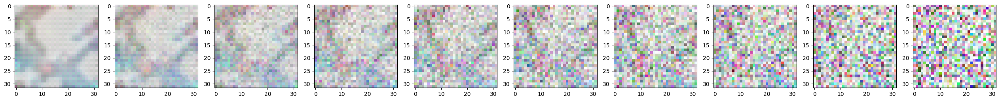

 83%|████████▎ | 830/1000 [1:07:01<12:40,  4.47s/it]

Epoch 830 | step 000 Loss: 0.06263497471809387 


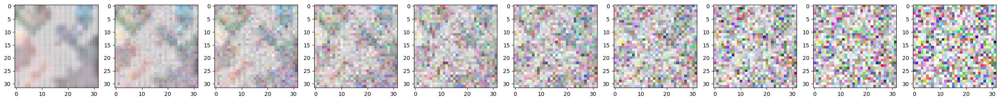

 84%|████████▎ | 835/1000 [1:07:25<12:23,  4.51s/it]

Epoch 835 | step 000 Loss: 0.07127784192562103 


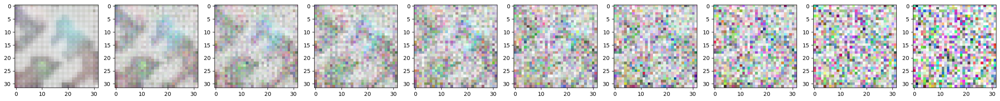

 84%|████████▍ | 840/1000 [1:07:49<12:00,  4.51s/it]

Epoch 840 | step 000 Loss: 0.0910118892788887 


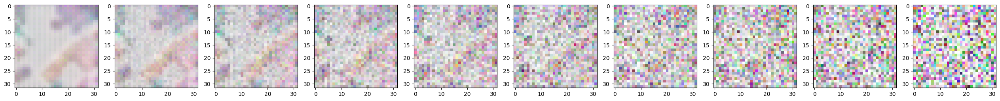

 84%|████████▍ | 845/1000 [1:08:14<11:43,  4.54s/it]

Epoch 845 | step 000 Loss: 0.08873219043016434 


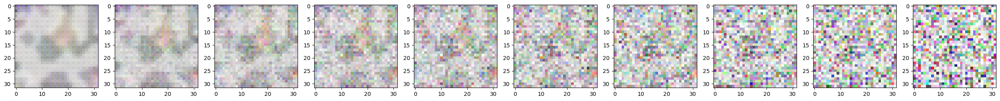

 85%|████████▌ | 850/1000 [1:08:37<11:13,  4.49s/it]

Epoch 850 | step 000 Loss: 0.10879845172166824 


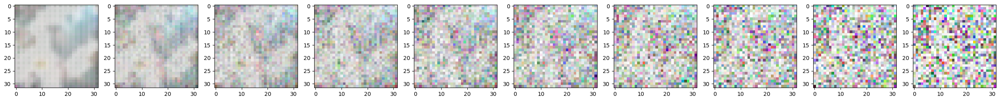

 86%|████████▌ | 855/1000 [1:09:02<10:52,  4.50s/it]

Epoch 855 | step 000 Loss: 0.08559136092662811 


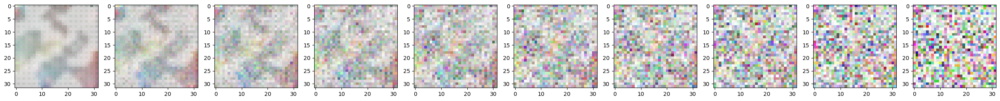

 86%|████████▌ | 860/1000 [1:09:26<10:34,  4.53s/it]

Epoch 860 | step 000 Loss: 0.07084791362285614 


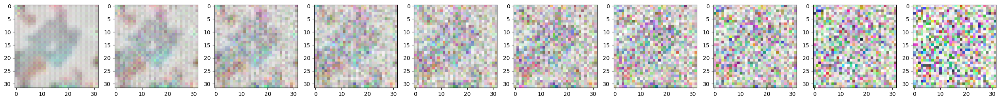

 86%|████████▋ | 865/1000 [1:09:51<10:16,  4.56s/it]

Epoch 865 | step 000 Loss: 0.08099868893623352 


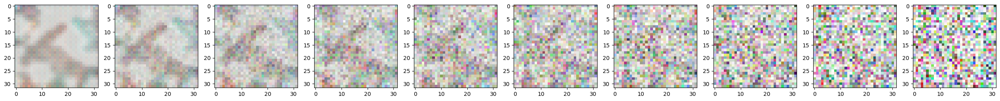

 87%|████████▋ | 870/1000 [1:10:15<09:44,  4.49s/it]

Epoch 870 | step 000 Loss: 0.07516612857580185 


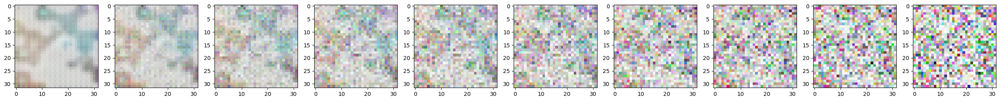

 88%|████████▊ | 875/1000 [1:10:39<09:20,  4.48s/it]

Epoch 875 | step 000 Loss: 0.10708729922771454 


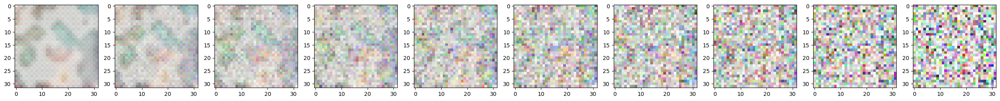

 88%|████████▊ | 880/1000 [1:11:04<09:03,  4.53s/it]

Epoch 880 | step 000 Loss: 0.07082998752593994 


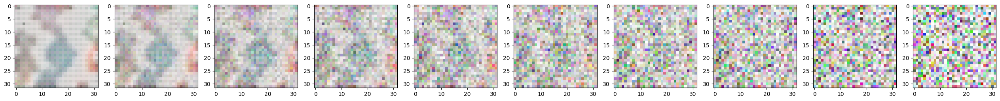

 88%|████████▊ | 885/1000 [1:11:28<08:38,  4.51s/it]

Epoch 885 | step 000 Loss: 0.07470082491636276 


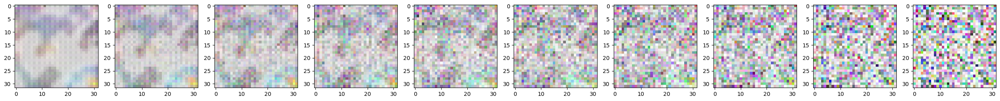

 89%|████████▉ | 890/1000 [1:11:52<08:16,  4.51s/it]

Epoch 890 | step 000 Loss: 0.07304127514362335 


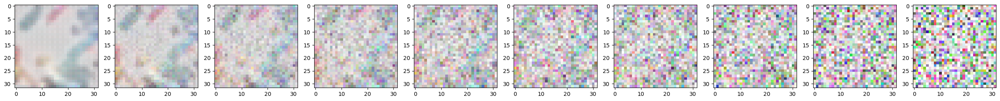

 90%|████████▉ | 895/1000 [1:12:16<07:51,  4.49s/it]

Epoch 895 | step 000 Loss: 0.08251920342445374 


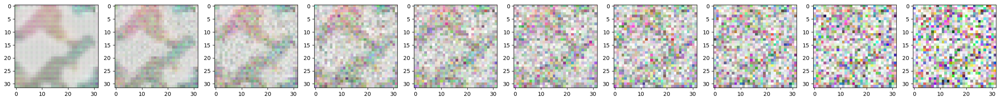

 90%|█████████ | 900/1000 [1:12:40<07:31,  4.51s/it]

Epoch 900 | step 000 Loss: 0.07916422933340073 


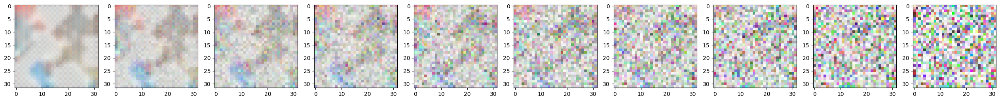

 90%|█████████ | 905/1000 [1:13:04<07:08,  4.51s/it]

Epoch 905 | step 000 Loss: 0.07646901905536652 


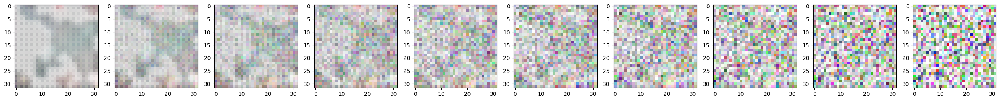

 91%|█████████ | 910/1000 [1:13:28<06:42,  4.47s/it]

Epoch 910 | step 000 Loss: 0.08775769174098969 


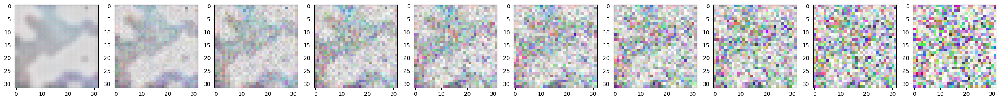

 92%|█████████▏| 915/1000 [1:13:52<06:20,  4.47s/it]

Epoch 915 | step 000 Loss: 0.06565303355455399 


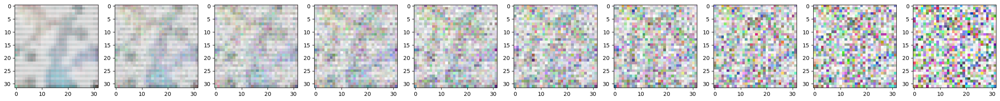

 92%|█████████▏| 920/1000 [1:14:17<06:01,  4.51s/it]

Epoch 920 | step 000 Loss: 0.06578270345926285 


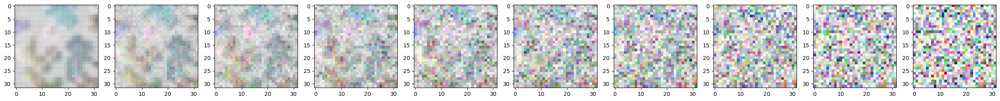

 92%|█████████▎| 925/1000 [1:14:41<05:38,  4.52s/it]

Epoch 925 | step 000 Loss: 0.08063990622758865 


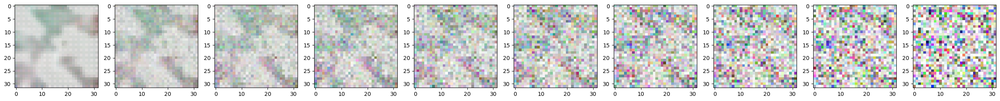

 93%|█████████▎| 930/1000 [1:15:06<05:20,  4.58s/it]

Epoch 930 | step 000 Loss: 0.07636179029941559 


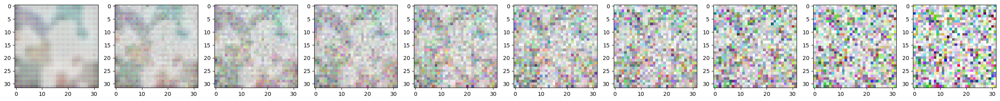

 94%|█████████▎| 935/1000 [1:15:30<04:50,  4.48s/it]

Epoch 935 | step 000 Loss: 0.056286104023456573 


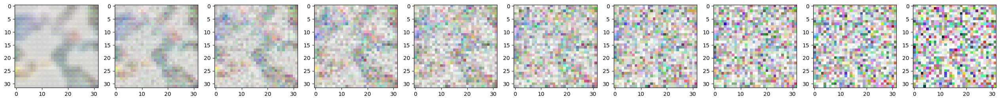

 94%|█████████▍| 940/1000 [1:15:55<04:31,  4.53s/it]

Epoch 940 | step 000 Loss: 0.11142876744270325 


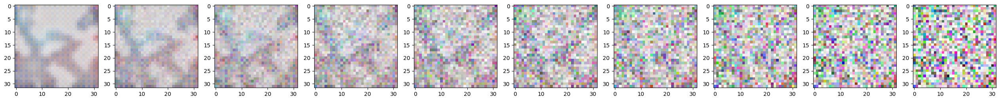

 94%|█████████▍| 945/1000 [1:16:18<04:06,  4.49s/it]

Epoch 945 | step 000 Loss: 0.09505483508110046 


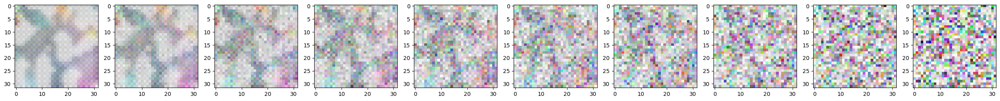

 95%|█████████▌| 950/1000 [1:16:43<03:46,  4.53s/it]

Epoch 950 | step 000 Loss: 0.07035395503044128 


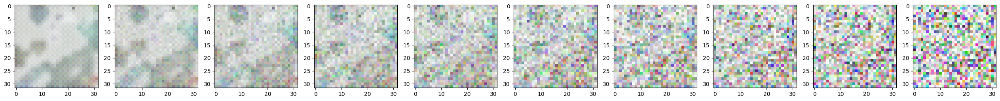

 96%|█████████▌| 955/1000 [1:17:06<03:21,  4.47s/it]

Epoch 955 | step 000 Loss: 0.08403803408145905 


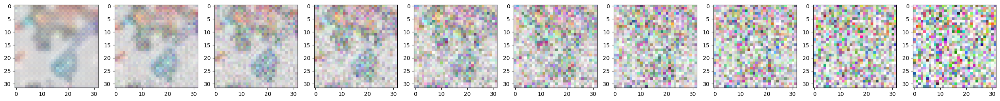

 96%|█████████▌| 960/1000 [1:17:31<03:00,  4.52s/it]

Epoch 960 | step 000 Loss: 0.0770026221871376 


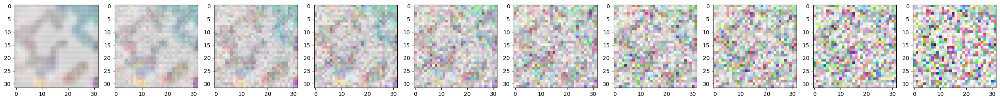

 96%|█████████▋| 965/1000 [1:17:55<02:37,  4.50s/it]

Epoch 965 | step 000 Loss: 0.07908545434474945 


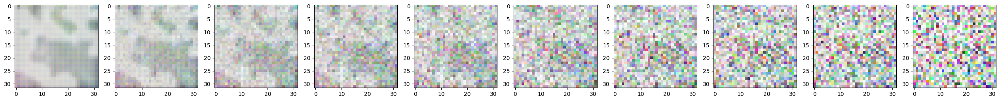

 97%|█████████▋| 970/1000 [1:18:20<02:16,  4.54s/it]

Epoch 970 | step 000 Loss: 0.06811785697937012 


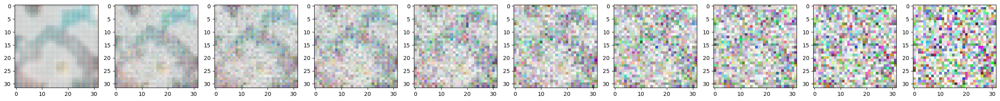

 98%|█████████▊| 975/1000 [1:18:43<01:52,  4.49s/it]

Epoch 975 | step 000 Loss: 0.0730317234992981 


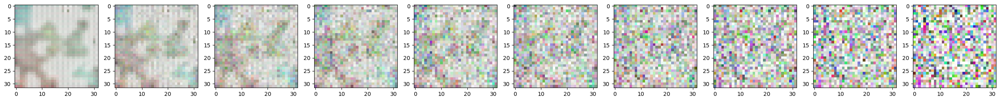

 98%|█████████▊| 980/1000 [1:19:08<01:30,  4.52s/it]

Epoch 980 | step 000 Loss: 0.05889429897069931 


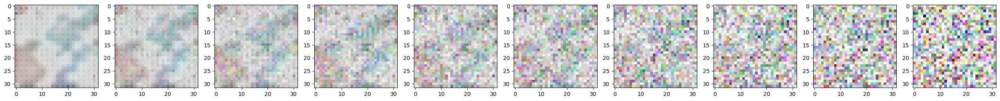

 98%|█████████▊| 985/1000 [1:19:33<01:08,  4.55s/it]

Epoch 985 | step 000 Loss: 0.09375899285078049 


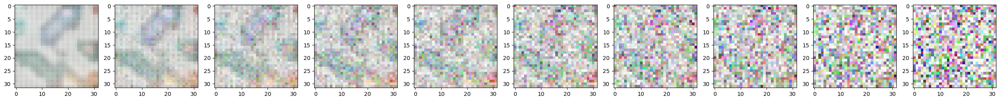

 99%|█████████▉| 990/1000 [1:19:57<00:45,  4.51s/it]

Epoch 990 | step 000 Loss: 0.08162031322717667 


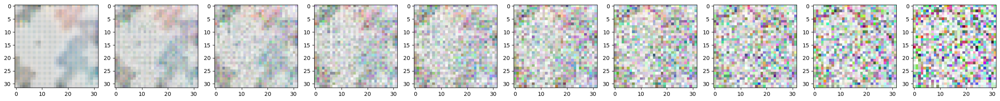

100%|█████████▉| 995/1000 [1:20:21<00:22,  4.57s/it]

Epoch 995 | step 000 Loss: 0.06790213286876678 


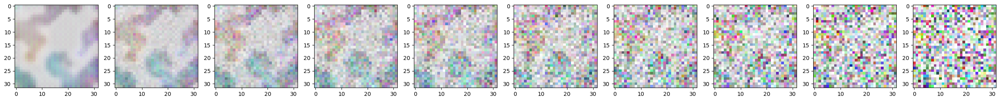

100%|██████████| 1000/1000 [1:20:46<00:00,  4.85s/it]


In [34]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 1000 # Try more!

for epoch in tqdm(range(epochs)):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()

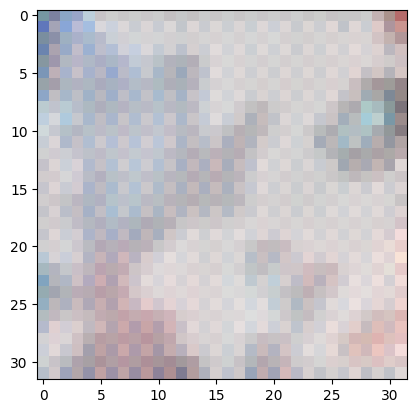

In [42]:
img = torch.randn((1, 4, IMG_SIZE, IMG_SIZE), device=device)

for i in range(0,T)[::-1]:
  t = torch.full((1,), i, device=device, dtype=torch.long)
  img = sample_timestep(img, t)
  img = torch.clamp(img, -1.0, 1.0)

show_tensor_image(img.detach().cpu())

In [43]:
# Save the model
torch.save(model.state_dict(), 'model.pth')